# Front Matter: CASA0013: Foundations of Spatial Data Science

## Title of Briefing:How well has the Airbnb market recovered from the onslaught of the COVID-19 pandemic?

### Student ID:20002335

### Word Count:1522

# Reproducible Analysis

Please feel free to add as many code cells and markdown cells of comment/explanation as needed to make your code legible and clear. Your code should output any figures needed to disk.

##  1 library the basic package

In [2]:
import os
import re
#Data Processing
import numpy as np
import pandas as pd
import geopandas as gpd
pd.set_option('display.max_columns', None)

#Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt 
import matplotlib.dates as mdates
import matplotlib.cm as cm
import seaborn as sns

In [3]:
#Maps Visualization
import geopandas as gpd
import folium
from folium import Choropleth

# 2 reading and Writing the data

We're going to start with reading a remote file and saving a local copy.

### data source

http://insideairbnb.com/get-the-data.html

In [4]:
# Set download URL
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/data/listings.csv.gz'

import pandas as pd
df = pd.read_csv(url, compression='gzip', low_memory=False)

print(f"Data frame is {df.shape[0]:,} x {df.shape[1]}")

Data frame is 67,903 x 74


## 2.2 Describing the Data Frame

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67903 entries, 0 to 67902
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            67903 non-null  int64  
 1   listing_url                                   67903 non-null  object 
 2   scrape_id                                     67903 non-null  int64  
 3   last_scraped                                  67903 non-null  object 
 4   name                                          67879 non-null  object 
 5   description                                   65388 non-null  object 
 6   neighborhood_overview                         40964 non-null  object 
 7   picture_url                                   67903 non-null  object 
 8   host_id                                       67903 non-null  int64  
 9   host_url                                      67903 non-null 

In [6]:
print(list(df.columns.values))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 

## 2.3 Save the File Local

In [7]:
import os
path = os.path.join('data','raw')
fn   = url.split('/')[-1]         
print(f"Writing to: {fn}")

Writing to: listings.csv.gz


In [8]:
#check it again!
if not os.path.exists(path):
    print(f"Creating {path} under {os.getcwd()}")
    os.makedirs(path)
    
df.to_csv(os.path.join(path,fn), index=False)
print("Done.")

Done.


# 2.4 Resetting & Reloading the DataFrame

Let's reload the data simply to make sure we're dealing with the local data set, and also limit the amount of rows and columns we load. We acquired 'cols' by duplicating the output of 'list(df.columns.values)' and then eliminating the fields we weren't interested in.

In [9]:
cols = ['id', 'listing_url', 'last_scraped', 'name', 'description', 'host_id', 'host_name', 'host_since', 
        'host_location', 'host_about', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 
        'host_listings_count', 'host_total_listings_count', 'host_verifications','neighbourhood_cleansed', 'latitude', 'longitude', 
        'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 
        'amenities', 'price', 'minimum_nights', 'maximum_nights', 'availability_365', 'number_of_reviews', 
        'first_review', 'last_review', 'review_scores_rating', 'review_scores_cleanliness', 
        'review_scores_checkin', 'review_scores_communication', 'review_scores_location','review_scores_value', 'license', 
        'instant_bookable', 'calculated_host_listings_count', 'reviews_per_month']

In [10]:
df = pd.read_csv(os.path.join(path,fn), usecols=cols,low_memory=False)
print(f"Data frame is {df.shape[0]:,} x {df.shape[1]}")

Data frame is 67,905 x 44


# 2.5 Dealing with NaNs and Nulls

In [11]:
df[df.id.isna()][['id','listing_url','name','description','host_id','host_name']]

,id,listing_url,name,description,host_id,host_name
2834,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/1c171...,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern..."
27351,NaN,NaN,f,https://a0.muscache.com/defaults/user_pic-50x5...,1.0,"['email', 'phone', 'facebook', 'reviews']"


### 2.5.2 Identifying Problem Rows

In [12]:
df[df.id.isna()][['id','listing_url','name','description','host_id','host_name']]

,id,listing_url,name,description,host_id,host_name
2834,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/1c171...,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern..."
27351,NaN,NaN,f,https://a0.muscache.com/defaults/user_pic-50x5...,1.0,"['email', 'phone', 'facebook', 'reviews']"


### 2.5.1 Counting Nulls by Column

In [13]:
df.isnull().sum(axis=0).sort_values(ascending=False)[:12]

license                        67905
bathrooms                      67903
host_response_rate             34290
host_acceptance_rate           33907
host_about                     30361
review_scores_value            20476
review_scores_location         20472
review_scores_checkin          20471
review_scores_communication    20434
review_scores_cleanliness      20419
reviews_per_month              19032
review_scores_rating           19030
dtype: int64

The most obvious ones here are:license,bathrooms,host_response_rate,host_acceptance_rate.So we just drop them!

In [14]:
df.drop(columns=['bathrooms','license','host_response_rate','host_acceptance_rate','host_about'], inplace=True)

### 2.5.3 Counting Nulls by Row

In [15]:
df.isnull().sum(axis=1).sort_values(ascending=False)

27350    30
2833     30
53372    19
53371    19
6564     15
         ..
38521     0
38522     0
38523     0
18133     0
0         0
Length: 67905, dtype: int64

<class 'pandas.core.series.Series'>


<AxesSubplot:ylabel='Frequency'>

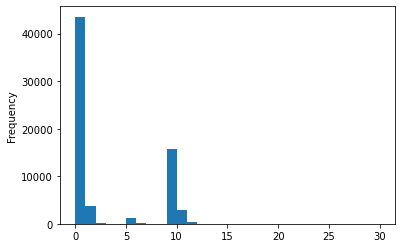

In [16]:
probs = df.isnull().sum(axis=1)
print(type(probs))       # has returned a series!
probs.plot.hist(bins=30) # check out with a series!

In [17]:
df.drop(probs[probs > 7].index, inplace=True)

In [18]:
print(f"Have reduced data frame to: {df.shape[0]} rows and {df.shape[1]} columns")

Have reduced data frame to: 48872 rows and 39 columns


# 2.6 Fixing the Remaining Data Issues

### 2.6.1 Transform the data to datatime format

In [19]:
dates = ['last_scraped','host_since','first_review','last_review']
df.sample(5, random_state=43)[dates]

,last_scraped,host_since,first_review,last_review
33529,2021-10-13,2014-04-01,2019-04-13,2021-10-09
32807,2021-10-11,2017-01-18,2018-07-04,2018-07-12
49491,2021-10-11,2018-06-11,2019-11-01,2019-11-01
40521,2021-10-11,2015-03-19,2019-06-22,2019-11-18
55667,2021-10-12,2014-02-19,2021-09-12,2021-09-12


In [20]:
for d in dates:
    print("Converting " + d)
    df[d] = pd.to_datetime(df[d], infer_datetime_format=True)

Converting last_scraped
Converting host_since
Converting first_review
Converting last_review


### 2.6.2 Categories

In [21]:
cats = ['property_type','room_type']
df.sample(5, random_state=43)[cats]

,property_type,room_type
33529,Entire residential home,Entire home/apt
32807,Private room in rental unit,Private room
49491,Private room in residential home,Private room
40521,Private room in rental unit,Private room
55667,Private room in condominium (condo),Private room


In [22]:
for c in cats:
    print(f"Converting {c}")
    df[c] = df[c].astype('category')

Converting property_type
Converting room_type


In [23]:
print(df[cats[1]].cat.categories.values)

['Entire home/apt' 'Hotel room' 'Private room' 'Shared room']


### 2.6.3  Dealing with Price

In [24]:
money = ['price']
df.sample(5, random_state=42)[money]

,price
36166,$85.00
65196,$129.00
25567,$275.00
57009,$120.00
62997,$33.00


In [25]:
for m in money:
    print(f"Converting {m}")
    df[m] = df[m].str.replace('$','').str.replace(',','').astype('float')

Converting price


/tmp/ipykernel_119/1928573030.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df[m] = df[m].str.replace('$','').str.replace(',','').astype('float')


In [26]:
# check it 
df.sample(5, random_state=42)[money]

,price
36166,85.0
65196,129.0
25567,275.0
57009,120.0
62997,33.0


### 2.6.4 dealing with Integers

In [27]:
ints  = ['id','host_id','host_listings_count','host_total_listings_count','accommodates',
         'beds','minimum_nights','maximum_nights','availability_365','calculated_host_listings_count']
for i in ints:
    print(f"Converting {i}")
    try:
        df[i] = df[i].astype('float').astype('int')
    except ValueError as e:
        print("\tConverting to unsigned 16-bit integer.")
        df[i] = df[i].astype('float').astype(pd.UInt16Dtype())

Converting id
Converting host_id
Converting host_listings_count
	Converting to unsigned 16-bit integer.
Converting host_total_listings_count
	Converting to unsigned 16-bit integer.
Converting accommodates
Converting beds
	Converting to unsigned 16-bit integer.
Converting minimum_nights
Converting maximum_nights
Converting availability_365
Converting calculated_host_listings_count


## 2.7 Validation

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48872 entries, 0 to 67829
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              48872 non-null  int64         
 1   listing_url                     48872 non-null  object        
 2   last_scraped                    48872 non-null  datetime64[ns]
 3   name                            48864 non-null  object        
 4   description                     47849 non-null  object        
 5   host_id                         48872 non-null  int64         
 6   host_name                       48855 non-null  object        
 7   host_since                      48855 non-null  datetime64[ns]
 8   host_location                   48781 non-null  object        
 9   host_is_superhost               48855 non-null  object        
 10  host_listings_count             48855 non-null  UInt16        
 11  ho

### 2.8 Saving the data in local

In [29]:
path = os.path.join('data','clean')

if not os.path.exists(path):
    print(f"Creating {path} under {os.getcwd()}")
    os.makedirs(path)
    
df.to_csv(os.path.join(path,fn), index=False)
print("Done.")

Done.


# 3 Number of bookings

In [30]:
# Set download URL
# You may want to check that this shows you 'raw' data if you
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/data/reviews.csv.gz'

# your code here
import pandas as pd
reviews = pd.read_csv(url,compression='gzip' ,low_memory=False)

print(f"Data frame is {reviews.shape[0]:,} x {reviews.shape[1]}")

Data frame is 1,048,405 x 6


As previously mentioned, we'll use the review rate as a proxy variable for the occupancy rate. We'll assume that the total number of reviews is proportional to the total number of bookings.

## 3.1 Changes in the total number of orders

In [31]:
#Group Total Reviews by Month and Year
reviews['date'] = pd.to_datetime(reviews['date'])
reviews = reviews.set_index('date')

year_reviews = reviews.resample('Y').size()
month_reviews = reviews.resample('M').size()
year_mean = month_reviews.resample('Y').mean()
year_mean = year_mean.shift(6, freq='M') #centre it in the middle of each year

In [32]:
plt.style.use('ggplot')

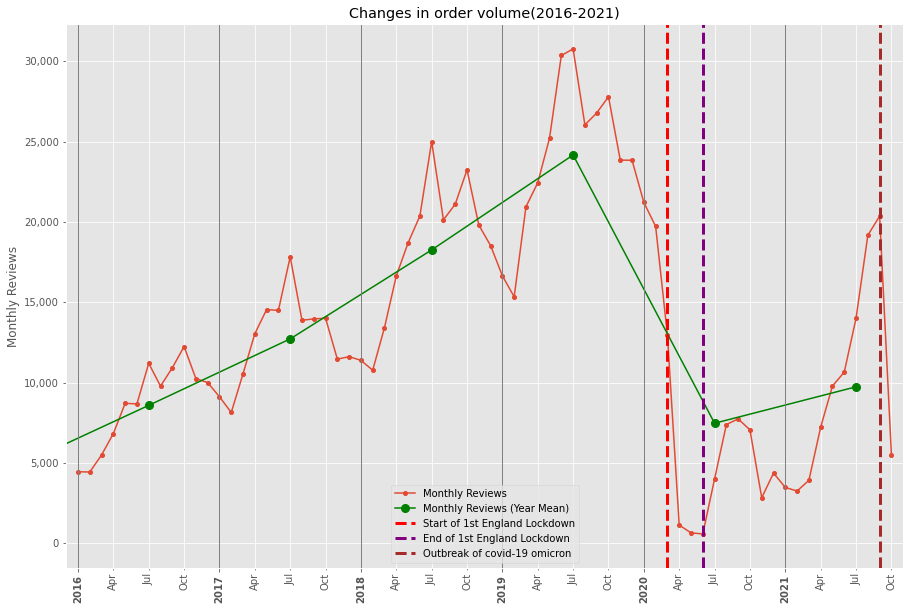

In [33]:
#Prepare x-axis dates
dates = pd.date_range(start='31-Jan-2016', end='31-Oct-2021', freq='3M')
dates = dates[dates.month!=1]
years = pd.to_datetime(list(range(2016,2022)), format='%Y')
years.strftime('%Y')

#Plot Total Reviews per Month Evolution
fig, ax = plt.subplots()
month_reviews_16_20 = month_reviews[month_reviews.index.year>=2016].copy()
month_reviews_16_20.plot(figsize=(15,10), marker='o', markersize=4, ax=ax, label='Monthly Reviews')
year_mean.plot(ax=ax, color='green', marker='o', markersize=8, label='Monthly Reviews (Year Mean)')
ax.axvline('20-March-2020', color='red', linestyle='--', label = 'Start of 1st England Lockdown', linewidth=3)
ax.axvline('1-June-2020', color='purple', linestyle='--', label = 'End of 1st England Lockdown', linewidth=3)
ax.axvline('30-Sep-2021', color='brown', linestyle='--', label = 'Outbreak of covid-19 omicron ', linewidth=3)

ax.set_xlim('Dec-2015','Nov-2021')
ax.set_xticks(years, minor=False)
ax.set_xticklabels(years.strftime('%Y'), rotation=90, minor=False, fontweight='bold')
ax.set_xticks(dates, minor=True)
ax.set_xticklabels(dates.strftime('%b'), rotation=90, minor=True)
ax.grid(which='minor')

for year in years:
    ax.axvline(year, linewidth=1, color='grey')

ax.get_yaxis().set_major_formatter(
    mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))    

ax.set_xlabel('')
ax.set_ylabel('Monthly Reviews')
ax.set_title('Changes in order volume(2016-2021)')
plt.legend();

## 4 Market Scale--Numer of listing 

Let us analyse the changes in the number of listings in each community.

To reduce the calculation, we have chosen the number of listings for 2021&2020

### 4.1 Number of active listings on the market

In [34]:
# Set download URL
# You may want to check that this shows you 'raw' data if you

url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/visualisations/listings.csv'


import pandas as pd
df2021 = pd.read_csv(url, low_memory=False)

print(f"Data frame is {df2021.shape[0]:,} x {df2021.shape[1]}")

Data frame is 67,903 x 18


In [35]:
# Set download URL
# You may want to check that this shows you 'raw' data if you

url = 'http://data.insideairbnb.com/united-kingdom/england/london/2020-12-16/visualisations/listings.csv'


import pandas as pd
df2020 = pd.read_csv(url, low_memory=False)

print(f"Data frame is {df2020.shape[0]:,} x {df2020.shape[1]}")

Data frame is 77,136 x 16


In [36]:
#Drop listings with no reviews
df2021.dropna(subset=['last_review'], inplace=True)
df2020.dropna(subset=['last_review'], inplace=True)

In [37]:
df2020['last_review'] = pd.to_datetime(df2020['last_review'])
df2021['last_review'] = pd.to_datetime(df2021['last_review'])

In [38]:
list_act_19 = df2020[df2020['last_review'].dt.year==2019]
list_act_20 = df2021[df2021['last_review'].dt.year==2020]
list_act_21 = df2021[df2021['last_review'].dt.year==2021]

In [39]:
#Combine both datasets to make it easier to plot

data_19 = list_act_19[['id','reviews_per_month', 'price', 'neighbourhood', 'room_type']].copy()
data_19['year']=2019
data_20 = list_act_20[['id','reviews_per_month', 'price', 'neighbourhood', 'room_type']].copy()
data_20['year']=2020
data_21 = list_act_21[['id','reviews_per_month', 'price', 'neighbourhood', 'room_type']].copy()
data_21['year']=2021


combined = pd.concat([data_19, data_20,data_21], ignore_index=True)

In [40]:
listing_types = pd.crosstab(index=combined['room_type'], columns=combined['year'])

In [41]:
# color choice for the future
blue="#30a2da"
red = "#fc4f30"
yellow = "#e5ae38"
green = "#6d904f"
grey = "#8b8b8b"

#### we plot it by use the bar chart

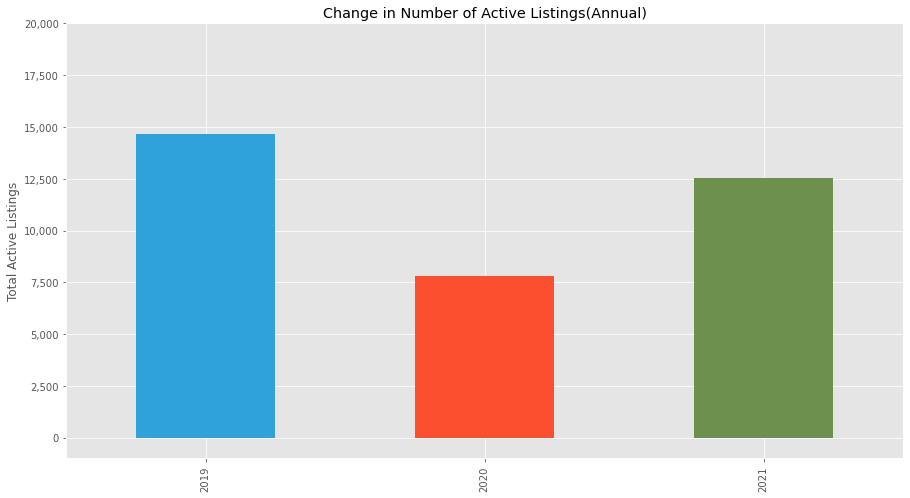

In [42]:
#Change in Number of Active Listings(Annual)
num_act_19 = len(list_act_19)
num_act_20 = len(list_act_20)
num_act_21 = len(list_act_21)

df_act = pd.Series({'2019':num_act_19,'2020':num_act_20, '2021':num_act_21})
fig,ax = plt.subplots(figsize=(15,8))
ax = df_act.plot.bar(color=[blue, red, green])
ax.get_yaxis().set_major_formatter(
    mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.set_ylim(-1000,20000)
ax.set_xlabel('')
ax.set_ylabel('Total Active Listings')
ax.set_title('Change in Number of Active Listings(Annual)');

#### Compare the difference in the number of properties in different neghbourhood

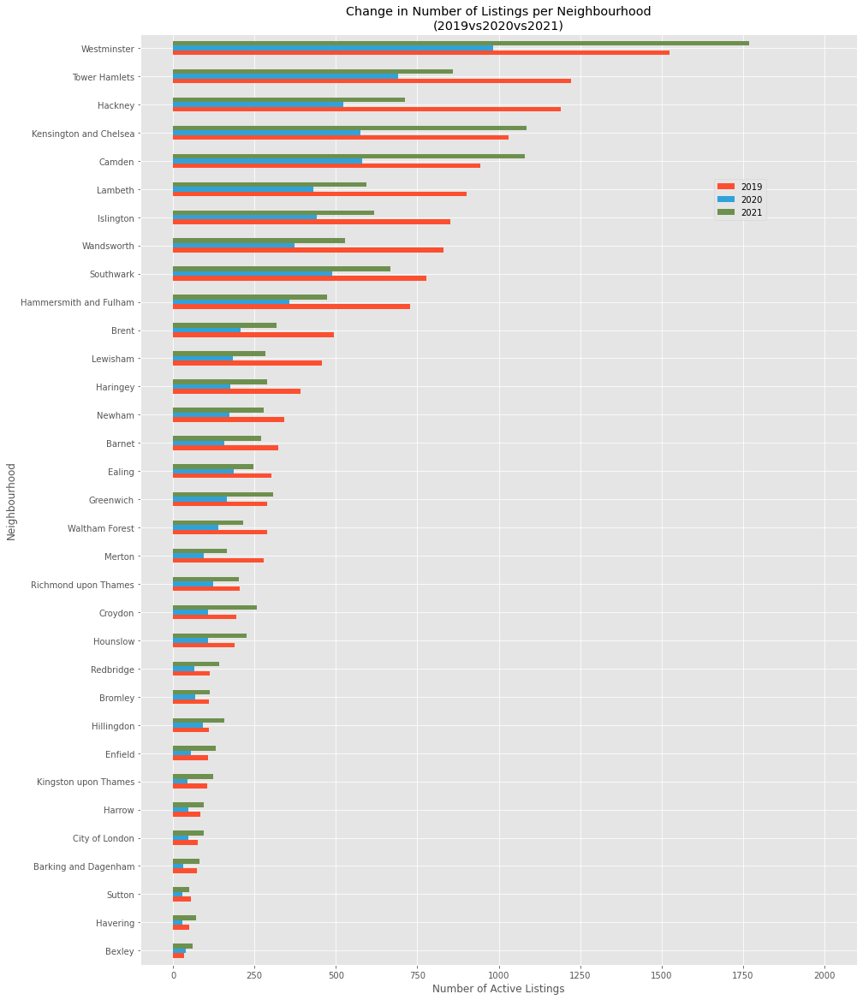

In [43]:
#Calculate the number of listings per neighbourhood
listings_nbd_year = pd.crosstab(index=combined['neighbourhood'], columns=combined['year'])
per_change = listings_nbd_year.apply(lambda row: (row.iloc[1]-row.iloc[0])/row.iloc[0], axis=1)
order = combined.loc[combined.year==2019, 'neighbourhood'].value_counts().sort_values(ascending=True).index
listings_nbd_year = listings_nbd_year.loc[order]
per_change = per_change.loc[order]

#Plot Change in Number of Listings per Neighbourhood
fig, ax = plt.subplots(figsize=(15,20))

listings_nbd_year[[2019,2020,2021]].plot.barh(ax=ax, color=[red,blue,green])
ax.set_xlabel('Number of Active Listings')
ax.set_ylabel('Neighbourhood')
ax.set_xlim(-100,2100)
ax.set_title('Change in Number of Listings per Neighbourhood\n(2019vs2020vs2021)')

    
ax.legend(loc=(0.8,0.8))
    
plt.show()

### load the shapefile

#### creat the function to download the shapefile of london ward

In [44]:
import os
from requests import get
from urllib.parse import urlparse

def cache_data(src:str, dest:str) -> str:
    """Downloads and caches a remote file locally.
    
    The function sits between the 'read' step of a pandas or geopandas
    data frame and downloading the file from a remote location. The idea
    is that it will save it locally so that you don't need to remember to
    do so yourself. Subsequent re-reads of the file will return instantly
    rather than downloading the entire file for a second or n-th itme.
    
    Parameters
    ----------
    src : str
        The remote *source* for the file, any valid URL should work.
    dest : str
        The *destination* location to save the downloaded file.
        
    Returns
    -------
    str
        A string representing the local location of the file.
    """
    
    url = urlparse(src) # We assume that this is some kind of valid URL 
    fn  = os.path.split(url.path)[-1] # Extract the filename
    dfn = os.path.join(dest,fn) # Destination filename
    
    # Check if dest+filename does *not* exist -- 
    # that would mean we have to download it!
    if not os.path.isfile(dfn):
        
        print(f"{dfn} not found, downloading!")
        
        # Convert the path back into a list (without)
        # the filename -- we need to check that directories
        # exist first.
        path = os.path.split(dest)
        
        # Create any missing directories in dest(ination) path
        # -- os.path.join is the reverse of split (as you saw above)
        # but it doesn't work with lists... so I had to google how
        # to use the 'splat' operator! os.makedirs creates missing
        # directories in a path automatically.
        if len(path) >= 1 and path[0] != '':
            os.makedirs(os.path.join(*path), exist_ok=True)
        
        # Download and write the file
        with open(dfn, "wb") as file:
            response = get(src)
            file.write(response.content)
            
        print("\tDone downloading...")

    else:
        print(f"Found {dfn} locally!")

    return dfn

In [45]:
ddir  = os.path.join('data','geo') # destination directory (in case it is not found this directory is created)
spath = 'https://github.com/jreades/i2p/blob/master/data/src/' # source path

boros = gpd.read_file( cache_data(spath+'Boroughs.gpkg?raw=true', ddir) )

Found data/geo/Boroughs.gpkg locally!


/opt/conda/envs/sds2021/lib/python3.9/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [46]:
boros1 = boros.to_crs("epsg:4326")

#### Interactive maps may take a while to load.

#### 2021-distribution of the number of listing

In [47]:
nb_listings = list_act_21['neighbourhood'].value_counts().sort_values()
boros
boroughs = boros1[['NAME', 'geometry']].set_index('NAME')

f = folium.Figure(width=1000, height=700)
m_1 = folium.Map(tiles='openstreetmap').add_to(f)
m_1.fit_bounds([[51.697855, -0.519505], [51.276832, 0.353619]])

Choropleth(geo_data=boroughs.__geo_interface__, 
           data=nb_listings, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           legend_name='Number of Listings'
          ).add_to(m_1)
m_1

#### 2020-distribution of the number of listing

In [48]:
nb_listings = list_act_20['neighbourhood'].value_counts().sort_values()
boros
boroughs = boros1[['NAME', 'geometry']].set_index('NAME')

f = folium.Figure(width=1000, height=700)
m_1 = folium.Map(tiles='openstreetmap').add_to(f)
m_1.fit_bounds([[51.697855, -0.519505], [51.276832, 0.353619]])

Choropleth(geo_data=boroughs.__geo_interface__, 
           data=nb_listings, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           legend_name='Number of Listings'
          ).add_to(m_1)
#plot the map
m_1

#### 2019-distribution of the number of listing

In [49]:
nb_listings = list_act_19['neighbourhood'].value_counts().sort_values()
boros
boroughs = boros1[['NAME', 'geometry']].set_index('NAME')

f = folium.Figure(width=1000, height=700)
m_1 = folium.Map(tiles='openstreetmap').add_to(f)
m_1.fit_bounds([[51.697855, -0.519505], [51.276832, 0.353619]])

Choropleth(geo_data=boroughs.__geo_interface__, 
           data=nb_listings, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           legend_name='Number of Listings(2019)'
          ).add_to(m_1)
m_1

# 5 Airbnb's reputation

#### Sentiment Analysis using VADER

VADER Sentiment Analysis :

VADER (Valence Aware Dictionary and sEntiment Reasoner) is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media. VADER uses a combination of A sentiment lexicon is a list of lexical features (e.g., words) which are generally labeled according to their semantic orientation as either positive or negative. VADER not only tells about the Positivity and Negativity score but also tells us about how positive or negative a sentiment is.

#### It is primarily used to measure changes in people's sentiment towards listings on airbnb between years.

#### You can tell the quality of service on the Airbnb platform from the results.

## 5.1 library the package for Sentiment Analysis

In [50]:
from wordcloud import WordCloud, STOPWORDS
from sklearn.preprocessing import OneHotEncoder # We don't use this but I point out where you *could*
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import string
import nltk
import spacy
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer

from nltk.corpus import stopwords
stopword_list = set(stopwords.words('english'))

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.tokenize.toktok import ToktokTokenizer
#from nltk.tokenize.stanford import StanfordTokenizer

from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer

from nltk import ngrams, FreqDist

lemmatizer = WordNetLemmatizer()
tokenizer = ToktokTokenizer()

[nltk_data] Downloading package wordnet to /home/jovyan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [51]:
# Sentiment Analysis
# load the SentimentIntensityAnalyser object in
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import nltk
nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jovyan/nltk_data...


In [52]:
# use the polarity_scores() method to get the sentiment metrics
def print_sentiment_scores(sentence):
    snt = analyzer.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(snt)))

In [53]:
# the compound score
def compound_score(text):
    compound_value = analyzer.polarity_scores(text)['compound']

## 5.2 load the review data and clean it

In [54]:
# Set download URL
# You may want to check that this shows you 'raw' data if you
url = 'http://data.insideairbnb.com/united-kingdom/england/london/2021-10-10/data/reviews.csv.gz'

# your code here
import pandas as pd
reviews = pd.read_csv(url,compression='gzip' ,low_memory=False)

print(f"Data frame is {reviews.shape[0]:,} x {reviews.shape[1]}")

Data frame is 1,048,405 x 6


In [55]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048405 entries, 0 to 1048404
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   listing_id     1048405 non-null  int64 
 1   id             1048405 non-null  int64 
 2   date           1048405 non-null  object
 3   reviewer_id    1048405 non-null  int64 
 4   reviewer_name  1048404 non-null  object
 5   comments       1047924 non-null  object
dtypes: int64(3), object(3)
memory usage: 48.0+ MB


## 5.3 link the data review and list data

In [56]:
df2021 = pd.read_csv(os.path.join('data','clean','listings.csv.gz'),compression='gzip', low_memory=False)

In [57]:
df_merge = pd.merge(reviews, df2021[['neighbourhood_cleansed', 'host_id', 'latitude',
                          'longitude', 'number_of_reviews', 'id', 'property_type']], 
              left_on='listing_id', right_on='id', how='left')


df_merge.drop(['id_y'], axis=1, inplace=True)

In [58]:
print("The dataset has {} rows and {} columns.".format(*df_merge.shape))

The dataset has 1048405 rows and 12 columns.


In [59]:
df_merge.drop(index=(df_merge[(df_merge.comments.isna()) | 
                  (df_merge.neighbourhood_cleansed.isna()) |
                  (df_merge.reviewer_name.isna())].index), inplace=True)
print(df_merge.shape)

(1047913, 12)


In [60]:
# check missing data
df_merge.isna().sum()

listing_id                0
id_x                      0
date                      0
reviewer_id               0
reviewer_name             0
comments                  0
neighbourhood_cleansed    0
host_id                   0
latitude                  0
longitude                 0
number_of_reviews         0
property_type             0
dtype: int64

In [61]:
# remove them
df_merge.dropna(inplace=True)
df_merge.isna().sum()
print(df_merge.shape)

(1047913, 12)


## 5.4 Word cloud

In [62]:
# remove punctuation
pattern = re.compile(r'[,\.!\-><=\(\)\[\]\/&\'\"’;]+')
punkt   = []
for c in df_merge:
    punkt.append(re.sub(pattern, ' ', c))

In [63]:
# Removing Stopword
from nltk.corpus import stopwords
stopword_list = set(stopwords.words('english'))
stopped = []
for p in punkt:
    stopped.append(' '.join([x for x in re.split(r'\s+', p) if x not in stopword_list]))

In [64]:
# Removing html
from bs4 import BeautifulSoup
cleaned = []
for l in df_merge:
    tmp = re.sub(r'(\/[A-Za-z]+\d?|[A-Za-z]+ \/)>','\\1> ', l)
    soup = BeautifulSoup(tmp, "html.parser")
    if not re.match(r'^\s*$',soup.get_text()):
        cleaned.append(soup.get_text())

In [65]:
# Visualizing the Data with WordClouds
# import other necessary libraries
from collections import Counter
from PIL import Image

In [66]:
# wrap the plotting in a function for easier access
def plot_wordcloud(wordcloud, language):
    plt.figure(figsize=(12, 10))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off")
    plt.title(language + ' Comments\n', fontsize=18, fontweight='bold')
    plt.show()

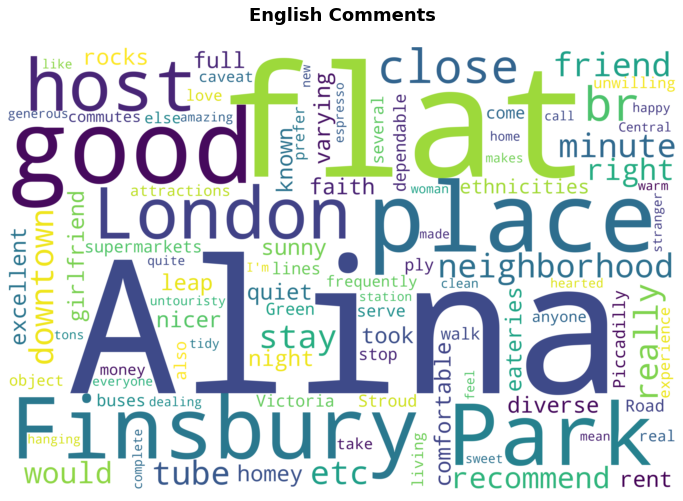

In [67]:
wordcloud = WordCloud(max_font_size=None, max_words=100, background_color="White", 
                      width=3000, height=2000,
                      stopwords=stopwords.words('english','german')).generate(str(df_merge.comments.values))

plot_wordcloud(wordcloud, "English")

## 5.5 Use semantic segmentation to score comments

In [68]:
# Sentiment Analysis
# load the SentimentIntensityAnalyser object in
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import nltk
nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [69]:
# use the polarity_scores() method to get the sentiment metrics
def print_sentiment_scores(sentence):
    snt = analyzer.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(snt)))

In [70]:
# getting only the compound score
def compound_score(text):
    compound_value = analyzer.polarity_scores(text)['compound']
    return compound_value

In [71]:
# transform the data 
df_merge['year'] = pd.DatetimeIndex(df_merge['date']).year

In [72]:
df_merge_2019=df_merge[df_merge['year']==2019]
df_merge_2020=df_merge[df_merge['year']==2020]
df_merge_2021=df_merge[df_merge['year']==2021]

#### Random adoption of three years of data to reduce the number of calculations  

In [73]:
# 
df_merge_2019_sample = df_merge_2019.sample(frac=0.06)
df_merge_2020_sample = df_merge_2020.sample(frac=0.2)
df_merge_2021_sample = df_merge_2021.sample(frac=0.2)
print(df_merge_2019_sample.shape)
print(df_merge_2020_sample.shape)
print(df_merge_2021_sample.shape)

(17392, 13)
(17898, 13)
(19444, 13)


#### The gap in the number of reviews per year is within an acceptable range

This function will make a sentence positive if the value of the text will be more than or equal to 0.05. It will make the text negative if the value of the text will be less than or equal to -0.05, else it will make the sentence neutral.

In [74]:
#it may spend 10 mins to run the conde or less
#2019
df_merge_2019_sample['sentiment_compound'] = df_merge_2019_sample['comments'].apply(compound_score)
#2020
df_merge_2020_sample['sentiment_compound'] = df_merge_2020_sample['comments'].apply(compound_score)
#2021
df_merge_2021_sample['sentiment_compound'] = df_merge_2021_sample['comments'].apply(compound_score)

In [75]:
#2019 comments class
good2019 = df_merge_2019_sample[df_merge_2019_sample['sentiment_compound']> 0.05].count()
bad2019  = df_merge_2019_sample[df_merge_2019_sample['sentiment_compound']<-0.05].count()
net2019  = df_merge_2019_sample[(df_merge_2019_sample['sentiment_compound']>-0.05)&(df_merge_2019_sample['sentiment_compound']<0.05)].count()

In [76]:
#2020 comments class
good2020 = df_merge_2020_sample[df_merge_2020_sample['sentiment_compound']> 0.05].count()
bad2020  = df_merge_2020_sample[df_merge_2020_sample['sentiment_compound']<-0.05].count()
net2020  = df_merge_2020_sample[(df_merge_2020_sample['sentiment_compound']>-0.05)&(df_merge_2020_sample['sentiment_compound']<0.05)].count()

In [77]:
#2021 comments class
good2021 = df_merge_2021_sample[df_merge_2021_sample['sentiment_compound']> 0.05].count()
bad2021  = df_merge_2021_sample[df_merge_2021_sample['sentiment_compound']<-0.05].count()
net2021  = df_merge_2021_sample[(df_merge_2021_sample['sentiment_compound']>-0.05)&(df_merge_2021_sample['sentiment_compound']<0.05)].count()

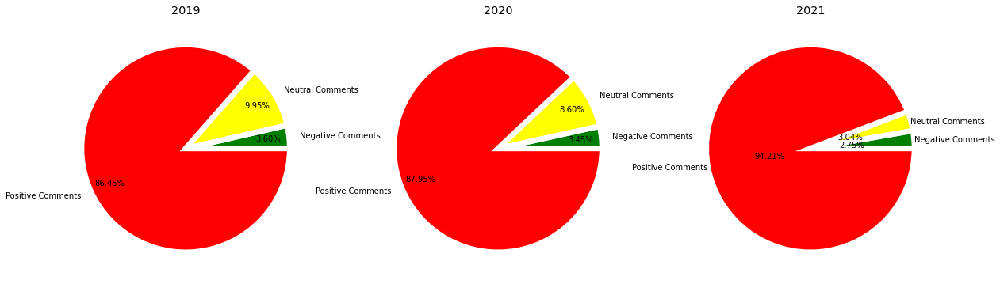

In [78]:
# Comparing Negative and Positive Comments
# assign the data
neg2019 = bad2019[1]
mid2019 = net2019[1]
pos2019 = good2019 [1]
names = ['Negative Comments', 'Neutral Comments','Positive Comments']
size2019 = [neg2019, mid2019, pos2019]

#2020
neg2020 = bad2020[1]
mid2020 = net2020[1]
pos2020 = good2020 [1]
names = ['Negative Comments', 'Neutral Comments','Positive Comments']
size2020 = [neg2020, mid2020, pos2020]

# 2021
neg2021 = bad2021[1]
mid2021 = net2021[1]
pos2021 = good2021 [1]
names = ['Negative Comments', 'Neutral Comments','Positive Comments']
size2021 = [neg2021, mid2021, pos2021]

# call a pie chart
plt.subplot(1,3,1)
plt.pie(size2019, labels=names, colors=['green', 'yellow', 'red'], 
        autopct='%.2f%%', pctdistance=0.8,labeldistance=1.1,
        wedgeprops={'linewidth':7, 'edgecolor':'white' })
plt.title('2019')

#fig.set_size_inches(20,15)
plt.savefig('data/raw/comparing2019.png')

plt.subplot(1,3,2)
plt.pie(size2020, labels=names, colors=['green', 'yellow', 'red'], 
        autopct='%.2f%%', pctdistance=0.8,
        wedgeprops={'linewidth':7, 'edgecolor':'white' })
plt.title('2020')
#fig.set_size_inches(20,15)
plt.savefig('data/raw/comparing2020.png')

plt.subplot(1,3,3)

plt.pie(size2021,labels=names, colors=['green', 'yellow', 'red'], 
        autopct='%.2f%%', pctdistance=0.4,labeldistance=1,
        wedgeprops={'linewidth':7, 'edgecolor':'white' })

plt.title('2021')



plt.savefig('data/raw/comparing2021.png')

# plot the donut chart
fig = plt.gcf()
fig.set_size_inches(20,20)
#fig.gca().add_artist(my_circle)
plt.show()

## 6 listing scores

In [79]:
scores = ['neighbourhood_cleansed','review_scores_rating','review_scores_cleanliness','review_scores_checkin','review_scores_communication',
         'review_scores_location','review_scores_value','id','latitude','longitude']

In [80]:
df_score = df2021[scores]

In [81]:
len(df_score.review_scores_value>0)

48872

In [82]:
df_score_groupby = df_score.groupby('neighbourhood_cleansed').mean()

In [83]:
df_score_groupby

,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,id,latitude,longitude
neighbourhood_cleansed,,,,,,,,,
Barking and Dagenham,4.362638,4.563964,4.761577,4.744144,4.504324,4.613559,3.321419e+07,51.543429,0.118748
Barnet,4.480784,4.617080,4.792028,4.799121,4.679667,4.628552,2.760567e+07,51.596587,-0.206185
Bexley,4.567485,4.634167,4.796287,4.793869,4.653054,4.645269,3.157095e+07,51.469494,0.136592
Brent,4.522060,4.660571,4.807616,4.813298,4.647768,4.638446,2.556209e+07,51.546313,-0.236376
Bromley,4.575638,4.609482,4.771865,4.789326,4.676943,4.641114,2.746733e+07,51.398959,-0.000468
Camden,4.512855,4.578772,4.762553,4.766933,4.827539,4.576404,2.676176e+07,51.537097,-0.146468
City of London,4.573468,4.652041,4.774057,4.752295,4.833566,4.596393,2.824518e+07,51.514878,-0.090166
Croydon,4.505663,4.648088,4.792411,4.794351,4.625250,4.656362,3.039482e+07,51.382994,-0.096078
Ealing,4.560685,4.655328,4.832740,4.823425,4.697705,4.670761,2.519001e+07,51.513414,-0.297924


In [84]:
df_score_groupby.reset_index(inplace=True)

In [85]:
df_vis=pd.merge(boros,df_score_groupby,left_on='NAME',right_on='neighbourhood_cleansed')

In [86]:
df_vis.sort_values('review_scores_value',axis=0,ascending=False)

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,geometry,neighbourhood_cleansed,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,id,latitude,longitude
0,Kingston upon Thames,E09000021,3726.117,0.000,F,"MULTIPOLYGON (((516401.600 160201.800, 516407....",Kingston upon Thames,4.668324,4.715128,4.865442,4.868262,4.780912,4.725128,2.743579e+07,51.404107,-0.286609
5,Havering,E09000016,11445.735,210.763,F,"MULTIPOLYGON (((549893.900 181459.800, 549894....",Havering,4.625480,4.667457,4.859709,4.845607,4.733140,4.722791,3.183417e+07,51.570663,0.196537
19,Richmond upon Thames,E09000027,5876.111,135.443,F,"MULTIPOLYGON (((516677.500 175383.800, 516678....",Richmond upon Thames,4.597977,4.710826,4.872141,4.872992,4.848881,4.706818,2.379593e+07,51.453162,-0.307190
12,Lewisham,E09000023,3531.706,16.795,T,"MULTIPOLYGON (((536691.000 178958.600, 536691....",Lewisham,4.554075,4.649806,4.831649,4.846679,4.654456,4.704010,2.476468e+07,51.457907,-0.028706
10,Lambeth,E09000022,2724.940,43.927,T,"MULTIPOLYGON (((530046.800 177893.400, 530048....",Lambeth,4.577642,4.659359,4.828961,4.849647,4.754278,4.703131,2.374763e+07,51.463897,-0.119152
16,Waltham Forest,E09000031,3880.793,0.000,F,"MULTIPOLYGON (((539923.100 191863.100, 539928....",Waltham Forest,4.593596,4.634138,4.831465,4.851442,4.664420,4.701887,2.578348e+07,51.578355,-0.012871
28,Hackney,E09000012,1904.902,0.000,T,"MULTIPOLYGON (((531928.400 187801.500, 531935....",Hackney,4.602109,4.639660,4.835867,4.864886,4.764072,4.697728,2.242452e+07,51.545755,-0.068661
21,Wandsworth,E09000032,3522.022,95.600,T,"MULTIPOLYGON (((523489.600 176224.800, 523500....",Wandsworth,4.540244,4.689803,4.830259,4.840370,4.762679,4.692198,2.507759e+07,51.455999,-0.177485
15,Enfield,E09000010,8220.025,0.000,F,"MULTIPOLYGON (((531023.500 200933.600, 531039....",Enfield,4.568651,4.685918,4.821589,4.840055,4.670082,4.681890,2.757123e+07,51.633966,-0.086737
4,Ealing,E09000009,5554.428,0.000,F,"MULTIPOLYGON (((510253.500 182881.600, 510249....",Ealing,4.560685,4.655328,4.832740,4.823425,4.697705,4.670761,2.519001e+07,51.513414,-0.297924


## 6.1 Listing Score - Statistical Description and Visualisation

The mean and median of the score are 4.65 and 4.65


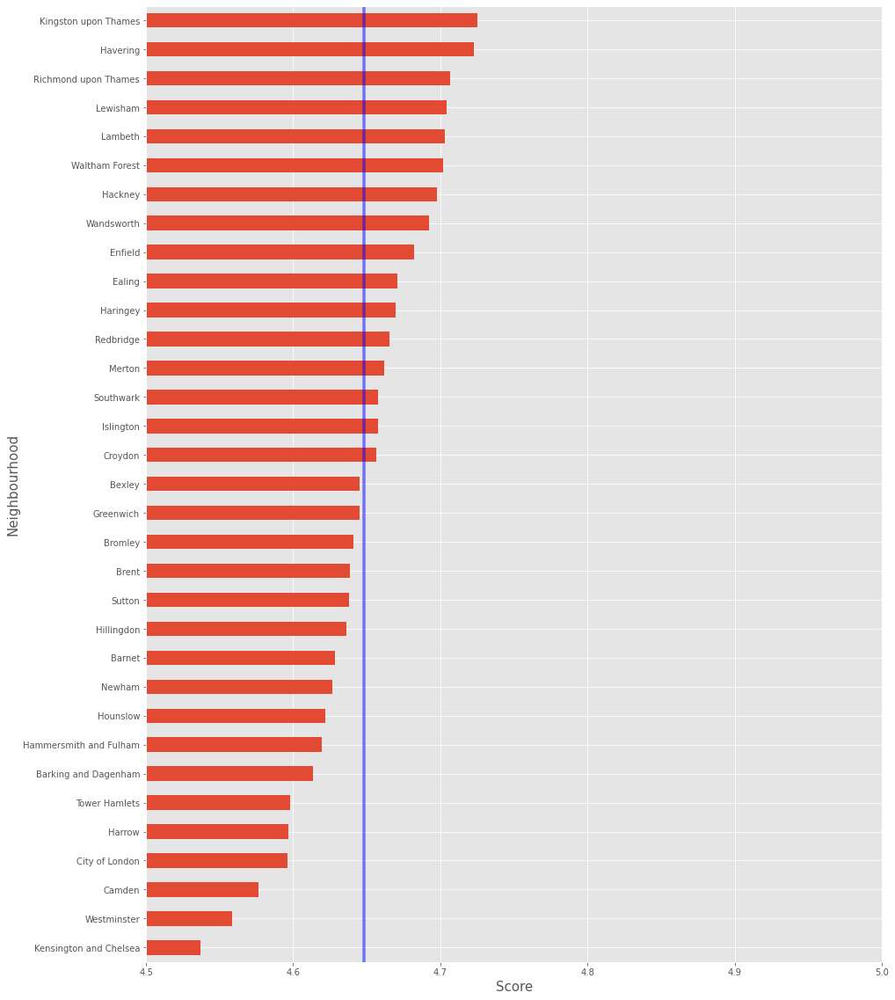

In [87]:
print(f"The mean and median of the score are {df_vis.review_scores_value.mean():,.2f} and {df_vis.review_scores_value.median():,.2f}")
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(15,20))
df_vis1 = df_vis.set_index('NAME')
df_vis1.sort_values('review_scores_value',inplace=True)
df_vis1['review_scores_value'].plot.barh(ax=ax)
ax.set_xlim(4.5,5)
ax.set_ylabel('Neighbourhood',fontsize=15)
ax.set_xlabel('Score',fontsize=15)
ax.axvline(df_vis.review_scores_value.mean(), color='blue', linewidth=3.5,alpha=0.5)
plt.show()

In [88]:
import json
from bokeh.plotting import figure
from bokeh.tile_providers import CARTODBPOSITRON, get_provider

from bokeh.io import output_file, show, output_notebook, push_notebook, export_png
from bokeh.models import ColumnDataSource, GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool
from bokeh.plotting import figure
from bokeh.palettes import brewer

output_notebook()

Loading BokehJS ...

In [89]:
def get_geodatasource(gdf):    
    """Get getjsondatasource from geopandas object"""
    json_data = json.dumps(json.loads(gdf.to_json()))
    return GeoJSONDataSource(geojson = json_data)

def bokeh_plot_map(gdf, column=None, title=''):
    """Plot bokeh map from GeoJSONDataSource """
    
    tile_provider = get_provider(CARTODBPOSITRON)

    geosource = get_geodatasource(gdf)
    palette = brewer['OrRd'][8]
    palette = palette[::-1]
    vals = gdf[column]
    
    #Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    color_mapper = LinearColorMapper(palette=palette, low=vals.min(), high=vals.max())
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, width=500, height=10,
                         location=(0,0), orientation='horizontal')

    tools = 'wheel_zoom,pan,reset,hover'
    
    p = figure(title = title, plot_height=700, plot_width=850, toolbar_location='right', tools=tools)
    p.add_tile(tile_provider)
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    
    # Add patch renderer to figure
    p.patches('xs','ys', source=geosource, fill_alpha=0.5, line_width=0.5, line_color='white',  
              fill_color={'field' :column , 'transform': color_mapper})
    
    # Specify figure layout.
    p.add_layout(color_bar, 'below')
    
    # Add hover
    hover = p.select_one(HoverTool)
    hover.point_policy = "follow_mouse"
    hover.tooltips = [("Name", "@NAME"),
                      ("Score", "@review_scores_value")]
    
    return p

In [90]:
p = bokeh_plot_map(df_vis, 'review_scores_value', title='Score in London')

handle = show(p, notebook_handle=True)
push_notebook(handle=handle)

## 6.2 Listing Score - between three years

In [91]:
scores = ['neighbourhood_cleansed','review_scores_rating','review_scores_cleanliness','review_scores_checkin','review_scores_communication',
         'review_scores_location','review_scores_value','id','latitude','longitude','last_review']

In [92]:
# load the new dataframe to 
df_score_sum = df2021[scores]

In [93]:
df_score_sum['year'] = pd.DatetimeIndex(df_score_sum['last_review']).year

/opt/conda/envs/sds2021/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


In [94]:
df_score_sum_2019=df_score_sum[df_score_sum['year']==2019]
df_score_sum_2020=df_score_sum[df_score_sum['year']==2020]
df_score_sum_2021=df_score_sum[df_score_sum['year']==2021]

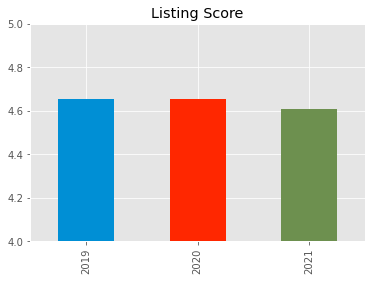

In [95]:
blue='#008FD5'
red = '#FF2700'
green = "#6d904f"
score_sum = pd.Series({2019:df_score_sum_2019.review_scores_value.mean(),2020:df_score_sum_2020.review_scores_value.mean(),2021:df_score_sum_2021.review_scores_value.mean()})
ax = score_sum .plot.bar(color=[blue, red, green])
ax.set_ylim(4.00,5.000)
ax.set_title('Listing Score')
plt.show()

# Executive Briefing
This markdown just help for the understanding the code!The PDF file is better for reading experience.






## Executive summary

In this report, my analysis uses the data sets from the Inside Airbnb Website:
"review.csv.gz" and "listing.csv.gz", tied in October 2020. The Inside Airbnb
Website collects, cleans, and filters raw data from *Airbnb.com* (Inside
Airbnb), becoming a valuable database to facilitate quantitative analysis.

This report examines Airbnb's business performance recovery in the London area
under the impacts of covid-19 and provides evidence to favor investing in Airbnb
London. It starts with an overview of Airbnb's business model and how the
covid-19 epidemic has affected its performance. After that, I formulate two
hypotheses, based on market demand and the Airbnb platform's reputation, to
assess the recovery of the Airbnb market in the London region. Data is examined,
and relevant charts and maps are generated using Python. Finally, my conclusion
part provides investment recommendations based on the results of my data
analysis and points out the limitations of my study.

**Key findings:**

1.  The impact of pandemic and lockdown in London has reduced the Airbnb
    housings demand by almost 70%, but its operating performance recovered very
    quickly in 2021.

2.  Airbnb listings have recovered to 2019 levels, even over 50% of regions
    expected to exceed 2019 listings.

3.  Airbnb maintains an excellent reputation among its users during the COVID-19
    pandemic.

## Background

(Geissinger et al., 2019) highlights the sharing economy has become a common way
of life in recent years due to the rapid development of digital technology.
Airbnb is one of the giant unicorns in the sharing economy; In other words,
Airbnb is growing at an astonishing rate into the hugely popular shared
accommodation platform (Zervas, Proserpio and Byers, 2017), aggregating
individuals' unused assets through a digital platform. However, the
unprecedented coronavirus has turned the world upside down for all of us,
affecting politics, society, and experiences across the globe. The shared
lifestyle becomes inappropriate in people's daily lives under the covid-19
pandemic due to the necessity of social distance and perpetuating enforced
blockades (Chen et al., 2021, p. 19).

The Airbnb business model allows anyone with idle space to become a host, and it
has lower tax and legal limitations than the hotel industry (Mikhalkina and
Cabantous, 2015). Besides a 90-day rental cap (Understanding Airbnb regulations
in London, n.d.) on entire houses or apartments, there are few laws or
regulatory controls in the London area, causing 'unfair' competition to regular
hotels (Todd, Musah and Cheshire, 2021). The sudden attack of covid-19 has
abruptly ended the outstanding performance of the entire Airbnb market in
London, with transaction volumes 30% lower than the previous year (fig1).

**Problem framing:**

The Covid-19 outbreak causes a significant challenge for Airbnb. Therefore, my
report would analyze the Airbnb resilience in the face of a pandemic and the
ability to manage operational difficulties. The results would provide a more
holistic view for investing in the Airbnb London market. The research question
of this report is:

How well has the Airbnb market recovered from the onslaught of the COVID-19
pandemic?

This research will examine the prospect of investing in the London Airbnb market
by accessing Airbnb's recovery after the pandemic. The report offers two
hypotheses: **1. Airbnb market performance shows a rapid rebound. 2. A
continuous rise in Airbnb's user reputation.** These hypotheses are predicated
on the assumption that covid-19 was unlike any prior Black Swan event in market
impact. It was unparalleled in extent and length and initiated a change in the
global community's way of life.

## Data Analysis

**Hypothesis1：Airbnb market performance shows a rapid rebound.**

It will test the hypothesis in two ways, market demand and market size, to
determine how well Airbnb performs in the London area.

Market demand:

Because the total number of orders is not explicitly stated in the information,
I converted the number of reviews to the total number of bookings. There is a
positive correlation between review data and the total number of bookings
(Kirkos, 2022). I created a line graph from over 1,040,000 data points organized
by year and month. ![](https://raw.githubusercontent.com/lijianqiao-UCL-scua/casa0013-final/main/img/fig1.png)

*Fig.1 Changes in order volume*


According to the graph (fig1), Airbnb's London business expanded steadily before
the epidemic. The number of bookings varied seasonally, with winter orders much
lower than summer orders. From March 2020 onwards, there was a steep decline
owing to the declaration of the first lockdown in England, which forced booking
reservations to be cancelled. After the lifting embargo was announced in June
2020, there was a swift rebound in bookings. By 2021, total orders had increased
significantly through September. I noticed that only ten days of data were
available for October, so dropping those data is necessary to ensure the
analysis's accuracy. Records in September nearly revert to the levels of the
same period in 2018. The second lockdown (November 2020–December 2020) and the
third lockdown (January–March 2021) had no significant effects on the
performance of the Airbnb market. In conclusion, the trends of the first three
quarters of 2021 reveal a resurgence in Airbnb market performance. Therefore,
remarkable market recovery in 2021 demonstrates Airbnb's success, despite the UK
may face another challenge caused by the effects of Omicron.

**Market Scale:**

The total number of in-use listings per neighbourhood is a critical metric for
measuring Airbnb's performance in the Greater London Area. We use the most
recent rating to determine whether a listing is still active on the market.

Firstly, I use bar charts to compare changes in the number of listings over
three years (2019-2021) to determine the market's overall size and distribution
(fig3). The total number of listings in 2021 almost returns to the level seen in
2019\. Then I examine the variation between boroughs. Over half of the regions
have exceeded 2019's active listing numbers, including Westminster, Kensington
and Chelsea, and Camden. More importantly, 2021's active rental housings in all
areas significantly increased compared to 2020. The map in fig3 demonstrates
that downtown London has primarily recovered from the harmful effects of the
pandemic. In comparison, surrounding regions have not fully returned to
pre-epidemic levels yet.

![](https://raw.githubusercontent.com/lijianqiao-UCL-scua/casa0013-final/main/img/fig2.1.png)![](https://raw.githubusercontent.com/lijianqiao-UCL-scua/casa0013-final/main/img/fig2.2.png)

*Fig2 Distribution of Listing(2019,2020)*

![](https://raw.githubusercontent.com/lijianqiao-UCL-scua/casa0013-final/main/img/fig3.png)

*Fig3 the Change of Listing*


**Hypothesis2. Airbnb's reputation among users continues to rise.**

A housing's rating score and its comments' content are critical aspects to
analyze because an ongoing improvement is necessary for sustained growth.
Therefore, hypothesis 2 will be tested by assessing those two aspects.

Customer Reviews:

I extracted comments information for the previous three years randomly and
selected 10% of them per year as the study sample. This part of the analysis
performed sentiment analysis on the sampled review data using the VADER
algorithm. The model would classify reviews into positive reviews, neutral
reviews, and negative reviews. Pie charts are used to demonstrate the rate of
types of comments (Fig4). Airbnb's reputation in London continues to grow, with
a threefold improvement from 2021 to 2020 compared to 2019. Neutral customer
reviews of Airbnb products have decreased from 9.85% in 2019 to 2.77% in 2021.
Additionally, Airbnb reduced bad ratings by 2.6% in 2021, following a modest
increase in unfavourable reviews in 2020.

![](https://raw.githubusercontent.com/lijianqiao-UCL-scua/casa0013-final/main/img/fig4.png)

*Fig4 Classification of Comments*

**Listing scores:**

A rating system is a critical indicator to determine the quality of listings.
Analyzing changes in ratings over time shows that the rate of Airbnb listings in
the London market has largely remained stable. The mean score is around 4.6 (the
blue line) and has not fluctuated dramatically by the pandemic or other factors.
However, the three boroughs with the most significant number of customers,
Westminster, Kensington and Chelsea, and Camden, have a considerable lower
rating score in comparison with other regions. (Fig5).

![](https://raw.githubusercontent.com/lijianqiao-UCL-scua/casa0013-final/main/img/fig5.png)


*Fig5 the Score of Neighborhood*

![](https://raw.githubusercontent.com/lijianqiao-UCL-scua/casa0013-final/main/img/fig6.png)


*Fig6 Distribution of Listing’s Score*

## Conclusion

Based on my analysis, I would accept both hypotheses. Airbnb has a remarkable
recovery in its demand and scale, even with some outperforming the 2019 market
in the first three quarters. Although a new outbreak in the UK in 2022 (BBC
News, 2021) will still impact the market performance to some extent, it will not
be as severe as it did on the business at the time of the first outbreak.
Secondly, Airbnb has accumulated a good reputation among its users which means
that the quality of its listings in the London area has continued to improve
over the last three years. Airbnb needs to continually focus on customer
suggestions and needs from reviews to keep the business running sustainably and
healthily.

In summary, Airbnb's operations in London have demonstrated strong risk
management and rapid recovery ability. The epidemic's impact is fading, and the
travel demand will continue to increase in the coming months, so Airbnb is set
to make a strong showing in the new economic growth in 2022. Therefore, I
recommend that investors invest in the Airbnb business by buying Airbnb shares
or investing in real estate. To be more specific, investing listings in core
areas of London is worthy. Meanwhile, an investment would also promote Airbnb's
operations, so investors then yield substantial gains.

The limitation of this report is that the data is incomplete, so it cannot
provide a complete picture of Airbnb's performance in the London market in 2021.
The scope of the analysis is too limited and should cover all major global
markets to provide a more comprehensive picture of Airbnb's business
performance. Further modelling and quantificating of the various operating
metrics would have provided a more accurate assessment of the value of the
investment.

## Reference

BBC News (2021) ‘Covid-19: More than 10,000 new Omicron cases found in UK’, 18
December. Available at: https://www.bbc.com/news/uk-59711474 (Accessed: 10
January 2022).

Chen, G. *et al.* (2021) ‘COVID-19 pandemic exposes the vulnerability of the
sharing economy: a novel accounting framework’, *Journal of Sustainable
Tourism*, 0(0), pp. 1–18. doi:10.1080/09669582.2020.1868484.

Geissinger, A. *et al.* (2019) ‘How sustainable is the sharing economy? On the
sustainability connotations of sharing economy platforms’, *Journal of Cleaner
Production*, 206, pp. 419–429. doi:10.1016/j.jclepro.2018.09.196.

Inside Airbnb. Adding data to the debate. (no date) Inside Airbnb. Available at:
http://insideairbnb.com (Accessed: 10 January 2022).

Kirkos, E. (2022) ‘Airbnb listings’ performance: determinants and predictive
models’, European Journal of Tourism Research, 30, pp. 3012–3012.
doi:10.54055/ejtr.v30i.2142.

Mikhalkina, T. and Cabantous, L. (2015) ‘Business Model Innovation: How Iconic
Business Models Emerge’, in *Business Models and Modelling*. Emerald Group
Publishing Limited (Advances in Strategic Management), pp. 59–95.
doi:10.1108/S0742-332220150000033024.

Todd, J., Musah, A. and Cheshire, J. (2021) ‘Assessing the impacts of Airbnb
listings on London house prices’, Environment and Planning B: Urban Analytics
and City Science, p. 23998083211001836. doi:10.1177/23998083211001836.

*Understanding Airbnb regulations in London* (no date) *KeyNest - Smart Key
Exchange*. Available at: https://keynest.com/blog/airbnb-regulations-london
(Accessed: 10 January 2022).

Zervas, G., Proserpio, D. and Byers, J.W. (2017) ‘The Rise of the Sharing
Economy: Estimating the Impact of Airbnb on the Hotel Industry’, *Journal of
Marketing Research*, 54(5), pp. 687–705. doi:10.1509/jmr.15.0204.
